In [ ]:
!pip install pytesseract

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import pytesseract as pt
import plotly.express as px
import matplotlib.pyplot as plt
import xml.etree.ElementTree as xet
from google.colab.patches import cv2_imshow
from glob import glob
from skimage import io
from shutil import copy
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [ ]:
path = '/content/drive/MyDrive/Kavach 23/image_dataset/'
labels_dict = dict(filepath=[],xmin=[],xmax=[],ymin=[],ymax=[])
for folder in os.listdir(path):
  folder_path=path+folder
  for filename in os.listdir(folder_path):
    if filename.endswith('xml'):
      info = xet.parse(folder_path+'/'+filename)
      root = info.getroot()
      member_object = root.find('object')
      labels_info = member_object.find('bndbox')
      xmin = int(labels_info.find('xmin').text)
      xmax = int(labels_info.find('xmax').text)
      ymin = int(labels_info.find('ymin').text)
      ymax = int(labels_info.find('ymax').text)

      labels_dict['filepath'].append(folder_path+'/'+filename)
      labels_dict['xmin'].append(xmin)
      labels_dict['xmax'].append(xmax)
      labels_dict['ymin'].append(ymin)
      labels_dict['ymax'].append(ymax)

In [ ]:
df = pd.DataFrame(labels_dict)
df.to_csv('labels.csv',index=False)
df.head(5)

,filepath,xmin,xmax,ymin,ymax
0,/content/drive/MyDrive/Kavach 23/image_dataset...,189,333,266,303
1,/content/drive/MyDrive/Kavach 23/image_dataset...,101,242,323,374
2,/content/drive/MyDrive/Kavach 23/image_dataset...,121,244,163,202
3,/content/drive/MyDrive/Kavach 23/image_dataset...,142,316,148,230
4,/content/drive/MyDrive/Kavach 23/image_dataset...,138,348,249,301


In [ ]:
filename = df['filepath'][0]
def getFilename(filename):
  filename_image = xet.parse(filename).getroot().find('filename').text
  lf=filename.split('/')
  lf=lf[:-1]
  filename='/'.join(lf)
  filepath_image = os.path.join(filename+'/'+filename_image)
  return filepath_image
getFilename(filename)

'/content/drive/MyDrive/Kavach 23/image_dataset/google_images/1438b735-2d21-4879-8ed4-e5fa086e70c8___Maruti-Suzuki-Swift-Dzire-1.jpg.jpeg'

In [ ]:
image_path = list(df['filepath'].apply(getFilename))
image_path[:10]

['/content/drive/MyDrive/Kavach 23/image_dataset/google_images/1438b735-2d21-4879-8ed4-e5fa086e70c8___Maruti-Suzuki-Swift-Dzire-1.jpg.jpeg',
 '/content/drive/MyDrive/Kavach 23/image_dataset/google_images/0a720df9-e4ef-4e44-8c13-b39b9be8444d___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_Nissan-Terrano-6.jpg',
 '/content/drive/MyDrive/Kavach 23/image_dataset/google_images/11832b13-d514-4f1d-967c-d00e76d21e9b___Yellow-Number-Plate-With-Black-Lettering.jpg.jpeg',
 '/content/drive/MyDrive/Kavach 23/image_dataset/google_images/074d85b8-42ec-4d17-9b8e-9e51ae060243___hqdefault.jpg.jpeg',
 '/content/drive/MyDrive/Kavach 23/image_dataset/google_images/10c96324-3452-43e2-aa68-c8ae7d3c1b6e___844874771_1_1080x720_maruti-suzuki-wagon-r-vxi-bs-iii-2014-petrol-.jpg.jpeg',
 '/content/drive/MyDrive/Kavach 23/image_dataset/google_images/175ff546-0679-4cbb-ab03-acfcd96877b7___Maruti_Wagon_R_Rear.jpg.jpeg',
 '/content/drive/MyDrive/Kavach 23/image_dataset/google_images/07064c2c-2aa3-4419-91a4-92916de8e54c___mahin

/content/drive/MyDrive/Kavach 23/image_dataset/google_images/1438b735-2d21-4879-8ed4-e5fa086e70c8___Maruti-Suzuki-Swift-Dzire-1.jpg.jpeg



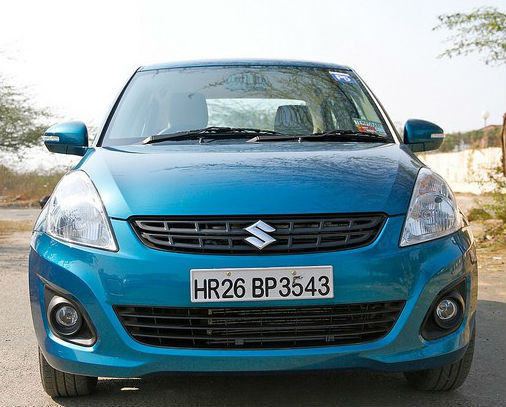

In [ ]:
#DATA VERIFICATION
file_path = image_path[0] #path of our image N2.jpeg
print(file_path)
img = cv2.imread(file_path) #read the image
img = io.imread(file_path) #Read the image
fig = px.imshow(img)
fig.update_layout(width=330, height=267, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 8 - N2.jpeg with bounding box')
fig.add_shape(type='rect',x0=187, x1=333, y0=266, y1=295, xref='x', yref='y',line_color='cyan')

In [ ]:
#DATA PROCESSING
labels = df.iloc[:,1:].values
data = []
output = []
for ind in range(len(image_path)):
    image = image_path[ind]
    img_arr = cv2.imread(image)
    h,w,d = img_arr.shape
    # Prepprocesing
    load_image = load_img(image,target_size=(224,224))
    load_image_arr = img_to_array(load_image)
    norm_load_image_arr = load_image_arr/255.0 # Normalization
    # Normalization to labels
    xmin,xmax,ymin,ymax = labels[ind]
    nxmin,nxmax = xmin/w,xmax/w
    nymin,nymax = ymin/h,ymax/h
    label_norm = (nxmin,nxmax,nymin,nymax) # Normalized output
    # Append
    data.append(norm_load_image_arr)
    output.append(label_norm)

In [ ]:
# Convert data to array
X = np.array(data,dtype=np.float32)
y = np.array(output,dtype=np.float32)

In [ ]:
# Split the data into training and testing set using sklearn.
x_train,x_test,y_train,y_test = train_test_split(X,y,train_size=0.8,random_state=0)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((875, 224, 224, 3), (219, 224, 224, 3), (875, 4), (219, 4))

In [ ]:
# parsing
def parsing(path):
    parser = xet.parse(path).getroot()
    name = parser.find('filename').text
    filename = path

    # width and height
    parser_size = parser.find('size')
    width = int(parser_size.find('width').text)
    height = int(parser_size.find('height').text)
    
    return filename, width, height
df[['filename','width','height']] = df['filepath'].apply(parsing).apply(pd.Series)
df.head()

,filepath,xmin,xmax,ymin,ymax,filename,width,height
0,/content/drive/MyDrive/Kavach 23/image_dataset...,189,333,266,303,/content/drive/MyDrive/Kavach 23/image_dataset...,506,407
1,/content/drive/MyDrive/Kavach 23/image_dataset...,101,242,323,374,/content/drive/MyDrive/Kavach 23/image_dataset...,800,600
2,/content/drive/MyDrive/Kavach 23/image_dataset...,121,244,163,202,/content/drive/MyDrive/Kavach 23/image_dataset...,602,339
3,/content/drive/MyDrive/Kavach 23/image_dataset...,142,316,148,230,/content/drive/MyDrive/Kavach 23/image_dataset...,480,360
4,/content/drive/MyDrive/Kavach 23/image_dataset...,138,348,249,301,/content/drive/MyDrive/Kavach 23/image_dataset...,500,457


In [ ]:
df['center_x'] = (df['xmax'] + df['xmin'])/(2*df['width'])
df['center_y'] = (df['ymax'] + df['ymin'])/(2*df['height'])

df['bb_width'] = (df['xmax'] - df['xmin'])/df['width']
df['bb_height'] = (df['ymax'] - df['ymin'])/df['height']
df.head()

,filepath,xmin,xmax,ymin,ymax,filename,width,height,center_x,center_y,bb_width,bb_height
0,/content/drive/MyDrive/Kavach 23/image_dataset...,189,333,266,303,/content/drive/MyDrive/Kavach 23/image_dataset...,506,407,0.515810,0.699017,0.284585,0.090909
1,/content/drive/MyDrive/Kavach 23/image_dataset...,101,242,323,374,/content/drive/MyDrive/Kavach 23/image_dataset...,800,600,0.214375,0.580833,0.176250,0.085000
2,/content/drive/MyDrive/Kavach 23/image_dataset...,121,244,163,202,/content/drive/MyDrive/Kavach 23/image_dataset...,602,339,0.303156,0.538348,0.204319,0.115044
3,/content/drive/MyDrive/Kavach 23/image_dataset...,142,316,148,230,/content/drive/MyDrive/Kavach 23/image_dataset...,480,360,0.477083,0.525000,0.362500,0.227778
4,/content/drive/MyDrive/Kavach 23/image_dataset...,138,348,249,301,/content/drive/MyDrive/Kavach 23/image_dataset...,500,457,0.486000,0.601751,0.420000,0.113786


In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15373, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 15373 (delta 0), reused 2 (delta 0), pack-reused 15368
Receiving objects: 100% (15373/15373), 14.34 MiB | 16.41 MiB/s, done.
Resolving deltas: 100% (10512/10512), done.


In [ ]:
!pip install -r ./yolov5/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 KB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 6.9 MB/s eta 0:00:00


In [ ]:
mkdir /content/yolov5/data_images

In [ ]:
mkdir /content/yolov5/data_images/test/

In [ ]:
mkdir /content/yolov5/data_images/train/

In [ ]:
### split the data into train and test
df_train = df.iloc[:int(len(df)*.8)]
df_test = df.iloc[int(len(df)*.8):]

In [ ]:
train_folder = './yolov5/data_images/train'

values = df_train[['filename','center_x','center_y','bb_width','bb_height']].values
for fname, x,y, w, h in values:
    image_name = os.path.split(fname)[-1]
    txt_name = os.path.splitext(image_name)[0]
    
    dst_image_path = os.path.join(train_folder,image_name)
    dst_label_file = os.path.join(train_folder,txt_name+'.txt')
    
    # copy each image into the folder
    copy(fname,dst_image_path)

    # generate .txt which has label info
    label_txt = f'0 {x} {y} {w} {h}'
    with open(dst_label_file,mode='w') as f:
        f.write(label_txt)
        
        f.close()

test_folder = './yolov5/data_images/test'

values = df_test[['filename','center_x','center_y','bb_width','bb_height']].values
for fname, x,y, w, h in values:
    image_name = os.path.split(fname)[-1]
    txt_name = os.path.splitext(image_name)[0]
    
    dst_image_path = os.path.join(test_folder,image_name)
    dst_label_file = os.path.join(test_folder,txt_name+'.txt')
    
    # copy each image into the folder
    copy(fname,dst_image_path)

    # generate .txt which has label info
    label_txt = f'0 {x} {y} {w} {h}'
    with open(dst_label_file,mode='w') as f:
        f.write(label_txt)
        
        f.close()

In [ ]:
import yaml
yaml_dict = {'train': 'data_images/train',   # path to the train folder
            'val': 'data_images/test', # path to the val folder
            'nc': 1,                             # number of classes
            'names': ['liscence_plate']}                # list of label names

with open(r'./yolov5/data.yaml', 'w') as file:
    documents = yaml.dump(yaml_dict, file)

In [ ]:
!nvidia-smi

Sun Apr  9 06:07:14 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install torch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install GPUtil

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for GPUtil: filename=GPUtil-1.4.0-py3-none-any.whl size=7408 sha256=1c95589c678fd75815c78356fddbe9958a6bacafc81f7c8f1088b7882359fb62
  Stored in directory: /root/.cache/pip/wheels/2b/b5/24/fbb56595c286984f7315ee31821d6121e1b9828436021a88b3
Successfully built GPUtil


In [ ]:


import torch
from GPUtil import showUtilization as gpu_usage
from numba import cuda

def free_gpu_cache():
    print("Initial GPU Usage")
    gpu_usage()                             

    torch.cuda.empty_cache()

    cuda.select_device(0)
    cuda.close()
    cuda.select_device(0)

    print("GPU Usage after emptying the cache")
    gpu_usage()

free_gpu_cache()  

Initial GPU Usage
| ID | GPU | MEM |
------------------
|  0 |  0% |  0% |
GPU Usage after emptying the cache
| ID | GPU | MEM |
------------------
|  0 |  6% |  1% |


In [ ]:
!python ./yolov5/train.py --data ./yolov5/data.yaml --cfg ./yolov5/models/yolov5s.yaml --batch-size 8 --name Model --epochs 100

2023-04-09 06:10:18.258428: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=yolov5/yolov5s.pt, cfg=./yolov5/models/yolov5s.yaml, data=./yolov5/data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=Model, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-135-g9dd0ad3 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmu

In [ ]:
# import onnx
# from onnx import utils

# model = onnx.load('model.onnx')
# model = utils.backward_compatible(model, target_version=11)
# onnx.save(model, 'model_v11.onnx')


In [ ]:
!python ./yolov5/export.py --weight ./yolov5/runs/train/Model/weights/best.pt --include torchscript onnx

export: data=yolov5/data/coco128.yaml, weights=['./yolov5/runs/train/Model/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx']
YOLOv5 🚀 v7.0-135-g9dd0ad3 Python-3.9.16 torch-2.0.0+cu118 CPU

Traceback (most recent call last):
  File "/content/./yolov5/export.py", line 672, in <module>
    main(opt)
  File "/content/./yolov5/export.py", line 667, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/_contextlib.py", line 115, in decorate_context
    return func(*args, **kwargs)
  File "/content/./yolov5/export.py", line 547, in run
    model = attempt_load(weights, device=device, inplace=True, fuse=True)  # load FP32 model
  File "/content/yolov5/models/experimental.py", line 79, 

In [ ]:
!python ./yolov5/export.py --weights ./yolov5/runs/train/Model/weights/best.pt --include torchscript onnx --opset 11


export: data=yolov5/data/coco128.yaml, weights=['./yolov5/runs/train/Model/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=11, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx']
YOLOv5 🚀 v7.0-135-g9dd0ad3 Python-3.9.16 torch-2.0.0+cu118 CPU

Traceback (most recent call last):
  File "/content/./yolov5/export.py", line 672, in <module>
    main(opt)
  File "/content/./yolov5/export.py", line 667, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/_contextlib.py", line 115, in decorate_context
    return func(*args, **kwargs)
  File "/content/./yolov5/export.py", line 547, in run
    model = attempt_load(weights, device=device, inplace=True, fuse=True)  # load FP32 model
  File "/content/yolov5/models/experimental.py", line 79, 

In [ ]:
#predictions

INPUT_WIDTH =  640
INPUT_HEIGHT = 640


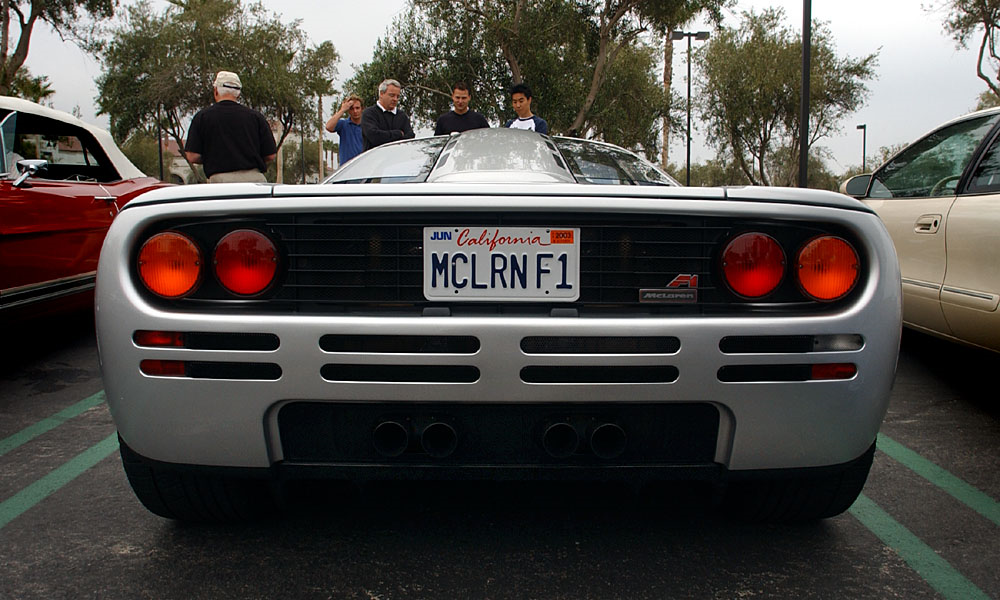

In [ ]:
# LOAD THE IMAGE
img = io.imread('/kaggle/input/car-number-plate-detection/Car_Number_Plate/1.png')

fig = px.imshow(img)
fig.update_layout(width=700, height=400, margin=dict(l=10, r=10, b=10, t=10))
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
fig.show()

In [ ]:
# LOAD YOLO MODEL
net = cv2.dnn.readNetFromONNX('./yolov5/runs/train/Model/weights/best.onnx')
net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)

In [ ]:
def get_detections(img,net):
    # 1.CONVERT IMAGE TO YOLO FORMAT
    image = img.copy()
    row, col, d = image.shape

    max_rc = max(row,col)
    input_image = np.zeros((max_rc,max_rc,3),dtype=np.uint8)
    input_image[0:row,0:col] = image

    # 2. GET PREDICTION FROM YOLO MODEL
    blob = cv2.dnn.blobFromImage(input_image,1/255,(INPUT_WIDTH,INPUT_HEIGHT),swapRB=True,crop=False)
    net.setInput(blob)
    preds = net.forward()
    detections = preds[0]
    
    return input_image, detections

def non_maximum_supression(input_image,detections):
    
    # 3. FILTER DETECTIONS BASED ON CONFIDENCE AND PROBABILIY SCORE
    
    # center x, center y, w , h, conf, proba
    boxes = []
    confidences = []

    image_w, image_h = input_image.shape[:2]
    x_factor = image_w/INPUT_WIDTH
    y_factor = image_h/INPUT_HEIGHT

    for i in range(len(detections)):
        row = detections[i]
        confidence = row[4] # confidence of detecting license plate
        if confidence > 0.4:
            class_score = row[5] # probability score of license plate
            if class_score > 0.25:
                cx, cy , w, h = row[0:4]

                left = int((cx - 0.5*w)*x_factor)
                top = int((cy-0.5*h)*y_factor)
                width = int(w*x_factor)
                height = int(h*y_factor)
                box = np.array([left,top,width,height])

                confidences.append(confidence)
                boxes.append(box)

    # 4.1 CLEAN
    boxes_np = np.array(boxes).tolist()
    confidences_np = np.array(confidences).tolist()
    
    # 4.2 NMS
    index = cv2.dnn.NMSBoxes(boxes_np,confidences_np,0.25,0.45)
    
    return boxes_np, confidences_np, index

def drawings(image,boxes_np,confidences_np,index):
    # 5. Drawings
    texts = []
    for ind in index:
        x,y,w,h =  boxes_np[ind]
        bb_conf = confidences_np[ind]
        conf_text = 'plate: {:.0f}%'.format(bb_conf*100)
        license_text = extract_text(image,boxes_np[ind])
        texts.append(license_text)


        cv2.rectangle(image,(x,y),(x+w,y+h),(255,0,255),2)
        cv2.rectangle(image,(x,y-30),(x+w,y),(255,0,255),-1)
        cv2.rectangle(image,(x,y+h),(x+w,y+h+25),(0,0,0),-1)


        cv2.putText(image,conf_text,(x,y-10),cv2.FONT_HERSHEY_SIMPLEX,0.7,(255,255,255),1)
        cv2.putText(image,license_text,(x,y+h+27),cv2.FONT_HERSHEY_SIMPLEX,0.7,(0,255,0),1)

    return image, texts

In [ ]:
# predictions flow with return result
def yolo_predictions(img,net):
    # step-1: detections
    input_image, detections = get_detections(img,net)
    # step-2: NMS
    boxes_np, confidences_np, index = non_maximum_supression(input_image, detections)
    # step-3: Drawings
    result_img, texts = drawings(img,boxes_np,confidences_np,index)
    return result_img, texts

In [ ]:
import easyocr

# initialize the EasyOCR reader
reader = easyocr.Reader(['en'])

def extract_text(image,bbox):
    x,y,w,h = bbox
    roi = image[y:y+h, x:x+w]
    
    if 0 in roi.shape:
        return 'no number'
    
    else:
        # extract text using EasyOCR
        result = reader.readtext(roi)
        text = ' '.join([res[1] for res in result])
        text = text.strip()
        
        return text


In [ ]:
# test
from PIL import Image
img = Image.open('/kaggle/input/testing/TEST1.png')

import numpy as np
img = np.array(img)
results, texts = yolo_predictions(img, net)
texts


['SN66 XMZ']


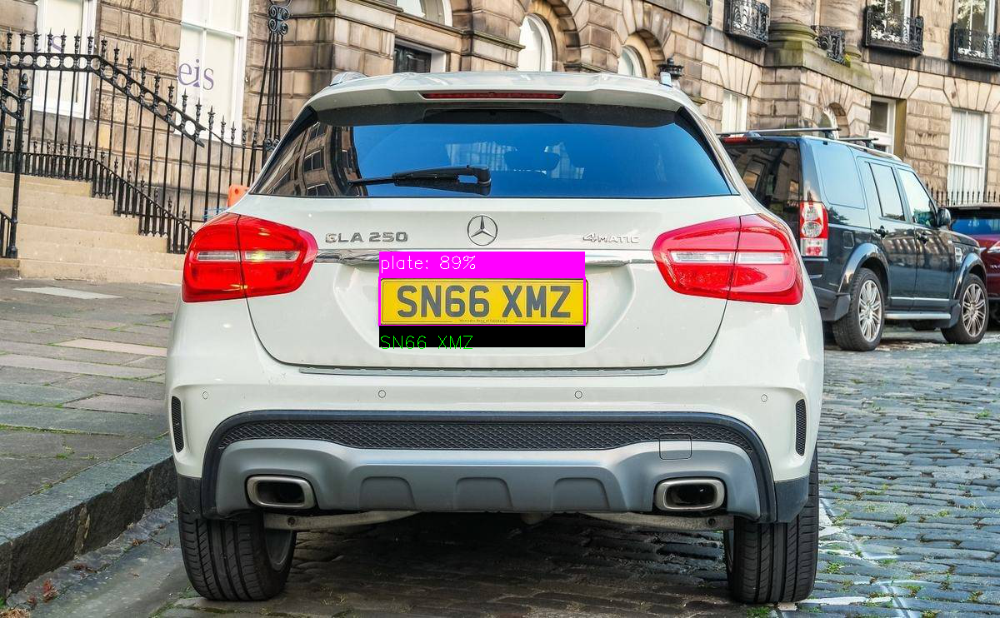

In [ ]:
fig = px.imshow(img)
fig.update_layout(width=700, height=400, margin=dict(l=10, r=10, b=10, t=10))
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
fig.show()

In [ ]:
!pip install libgtk2.0-dev

ERROR: Could not find a version that satisfies the requirement libgtk2.0-dev (from versions: none)
ERROR: No matching distribution found for libgtk2.0-dev


[]


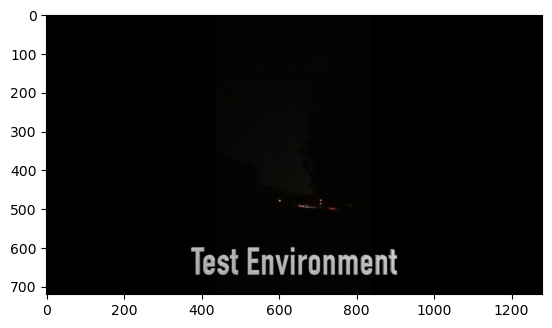

[]


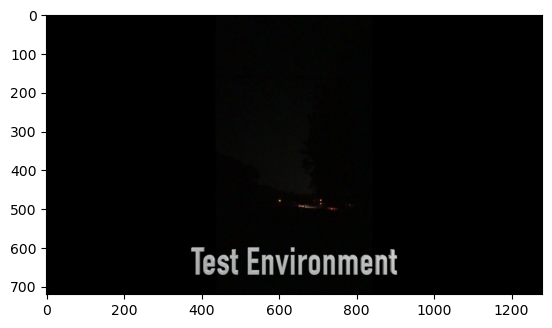

[]


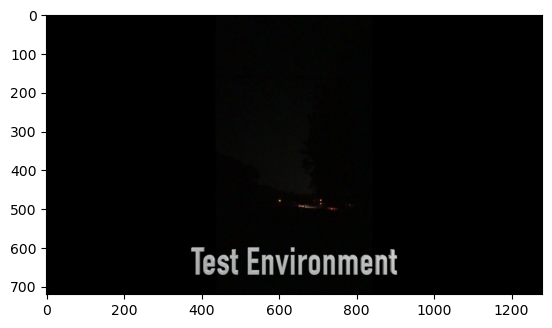

[]


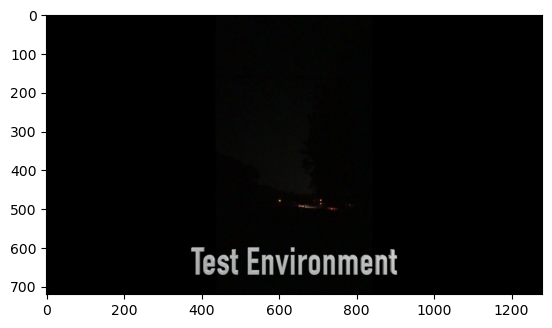

[]


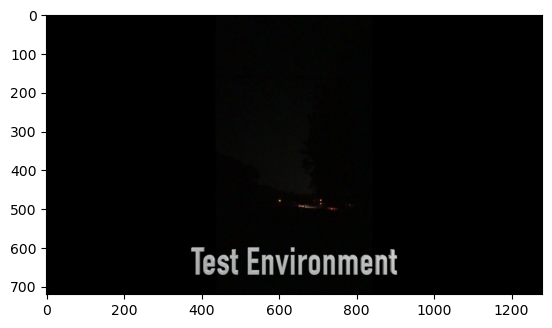

[]


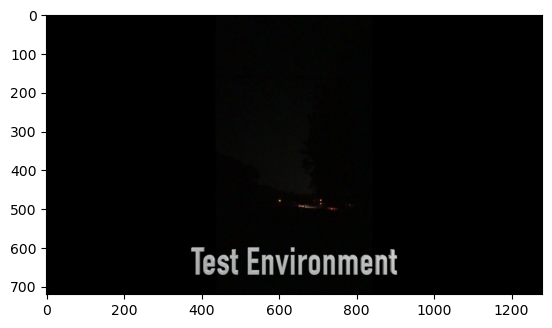

[]


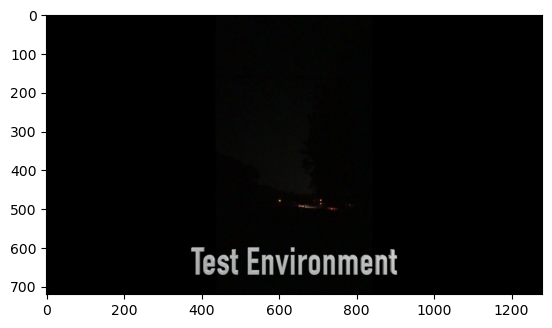

[]


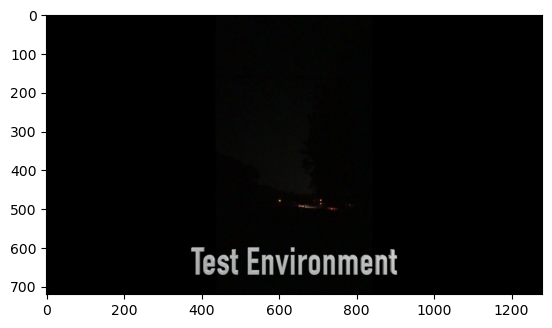

[]


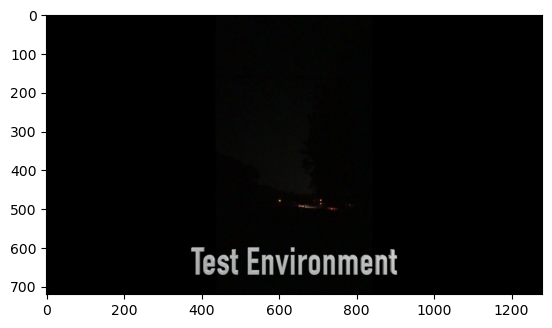

[]


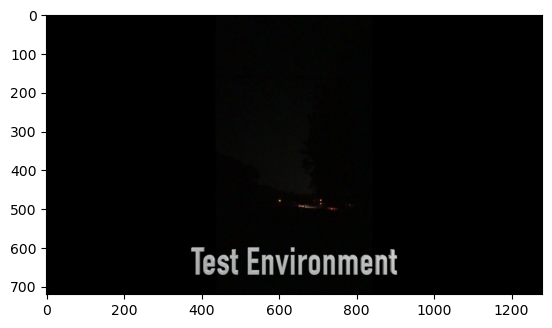

[]


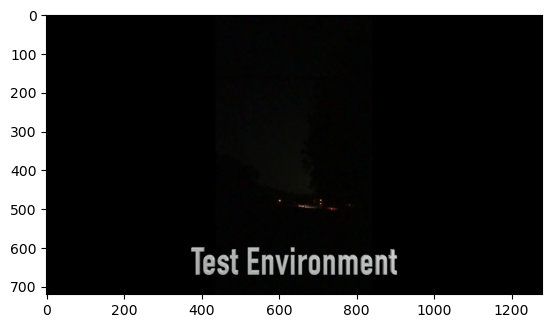

[]


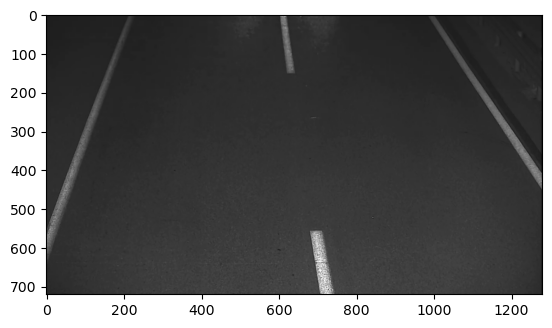

[]


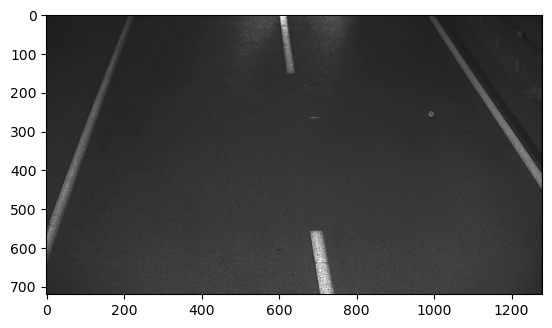

[]


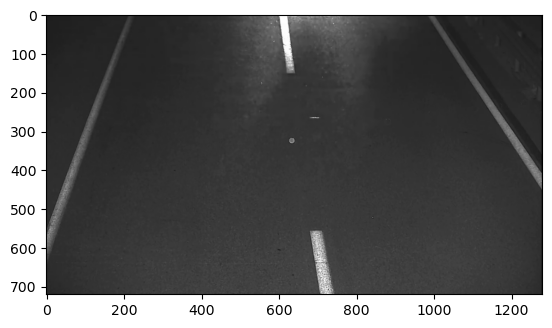

[]


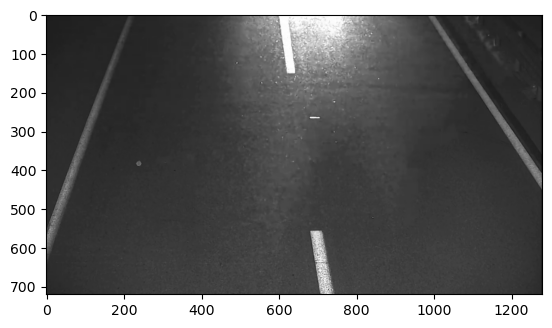

[]


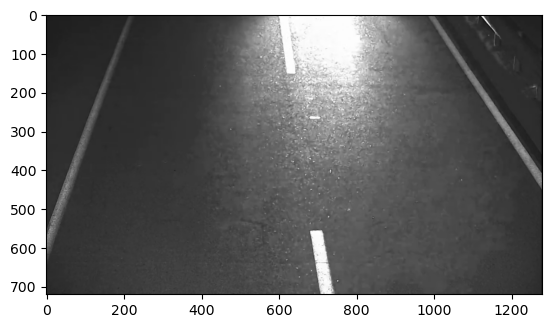

[]


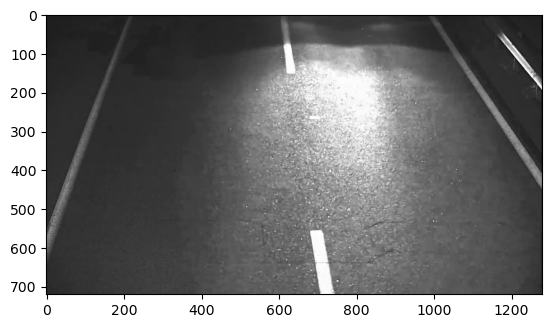

[]


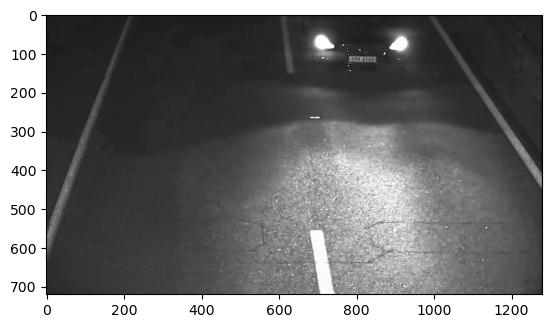

['L590 6165.']


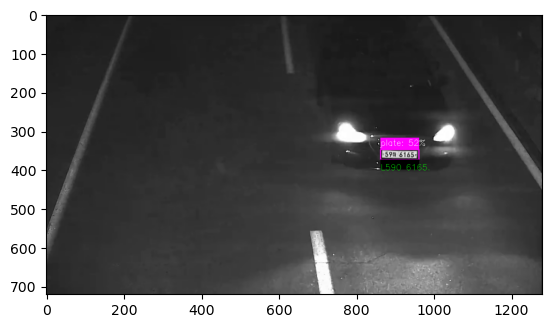

['590 6165,']


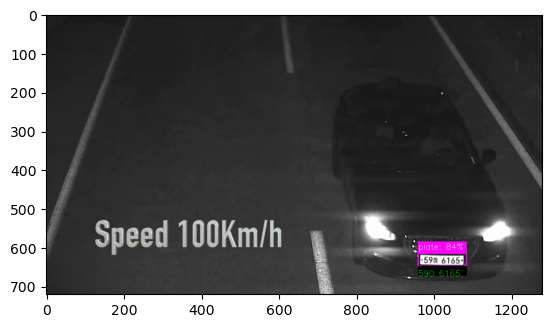

['590 6165-']


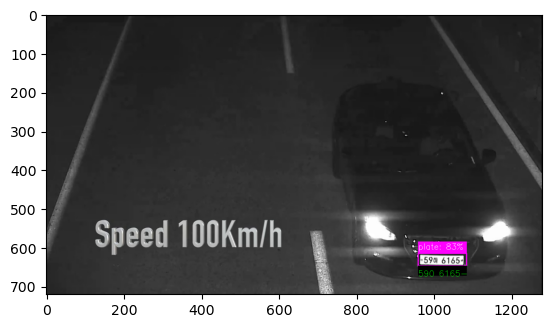

['590 6165-']


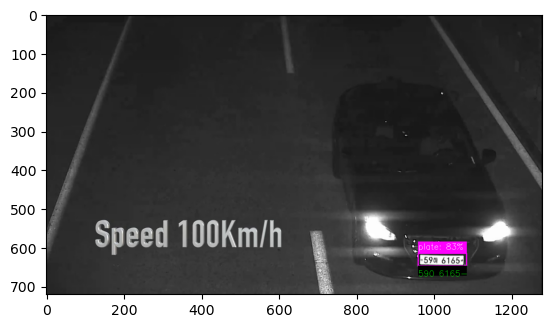

['590 6165-']


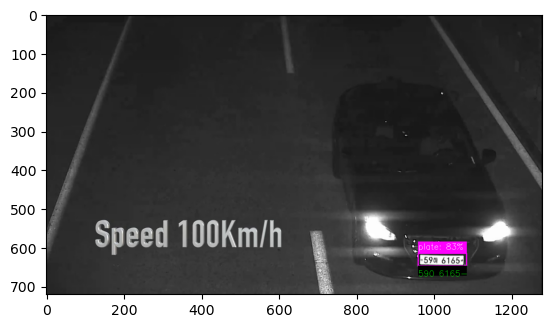

['590 6165-']


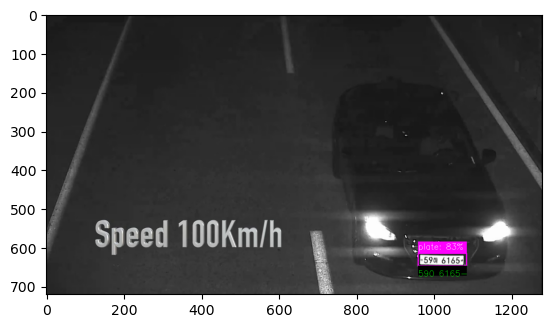

['590 6165-']


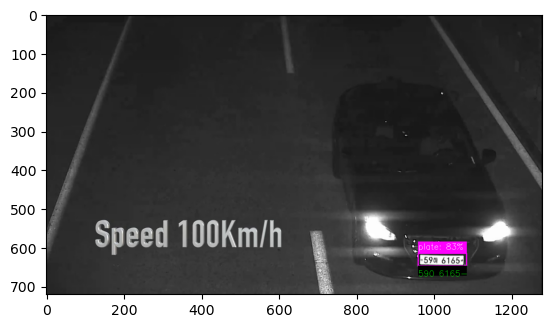

['590 6165-']


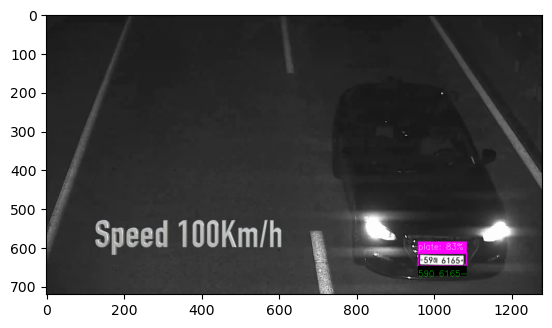

['590 6165-']


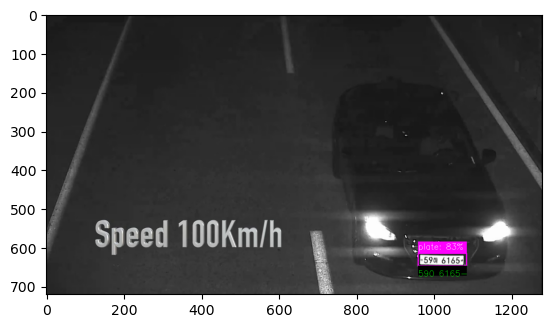

['590 6165-']


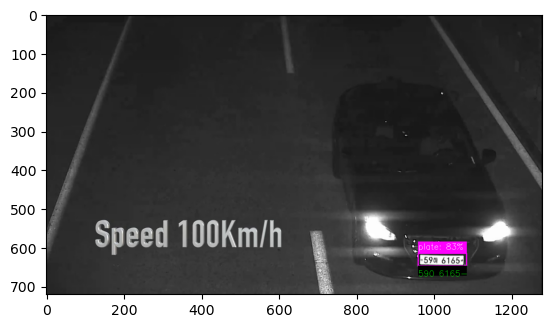

['590 6165-']


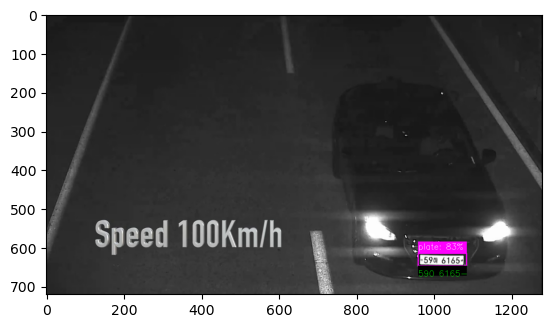

['590 6165-']


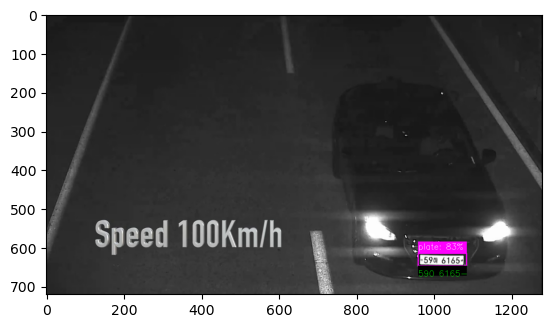

['590 6165,']


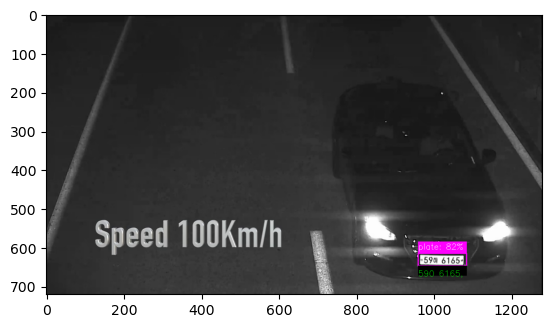

['590 6165,']


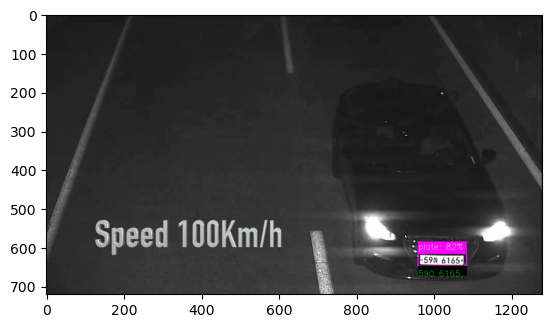

['590 6165,']


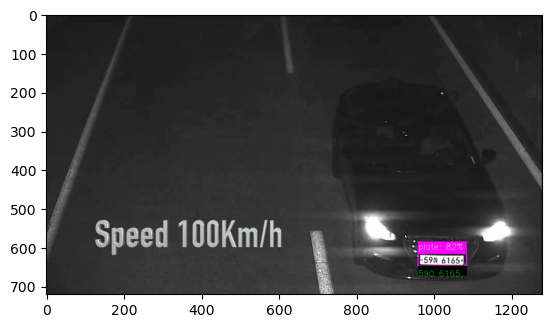

['590 6165,']


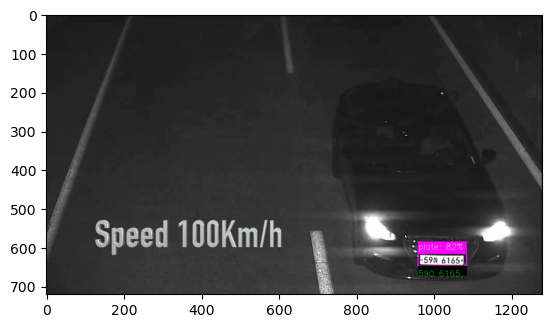

[]


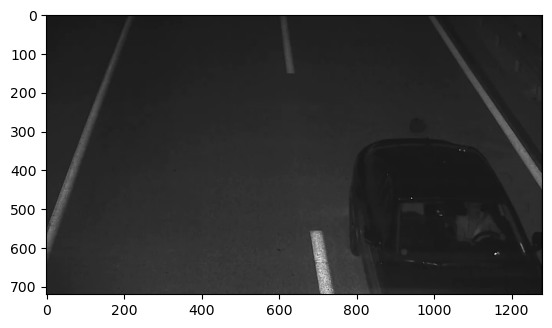

[]


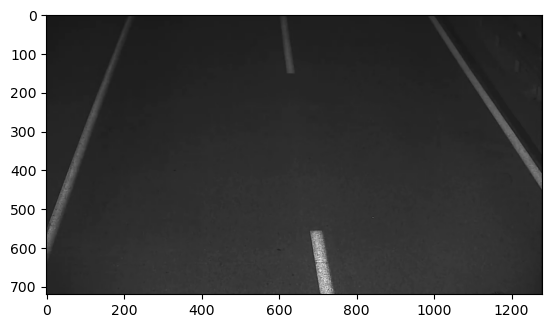

[]


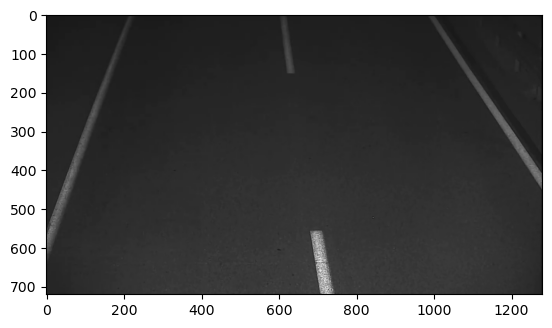

[]


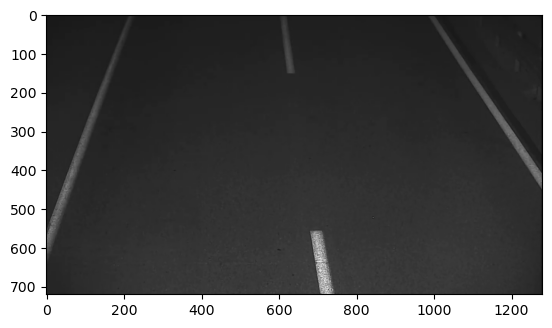

[]


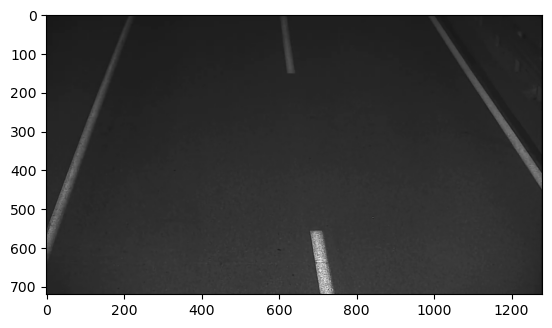

[]


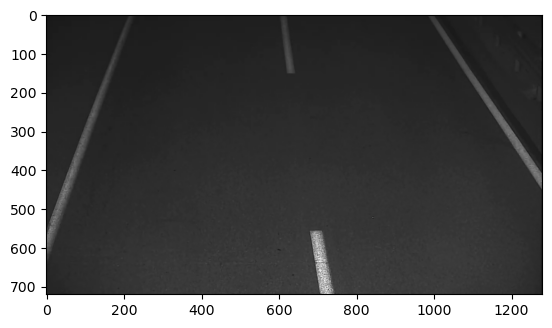

[]


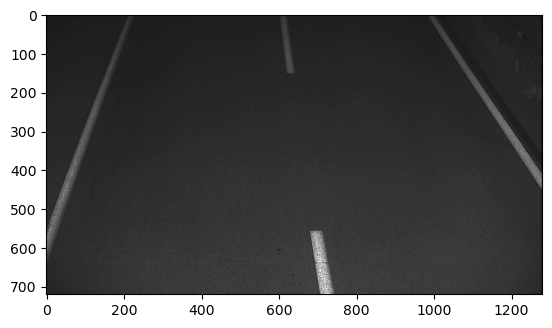

[]


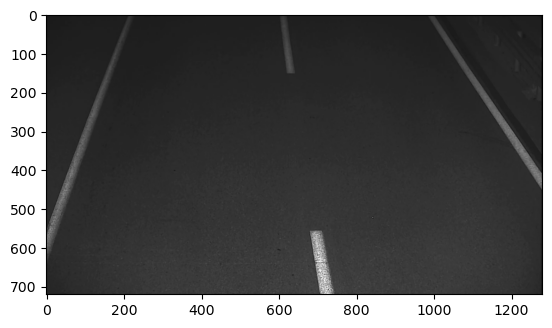

[]


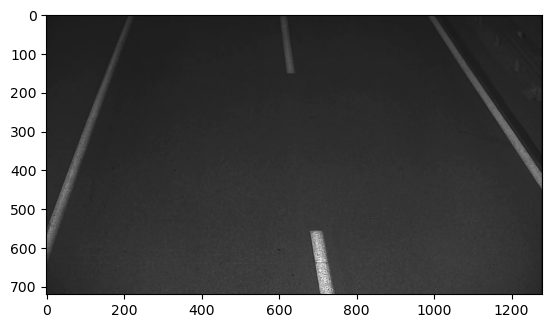

[]


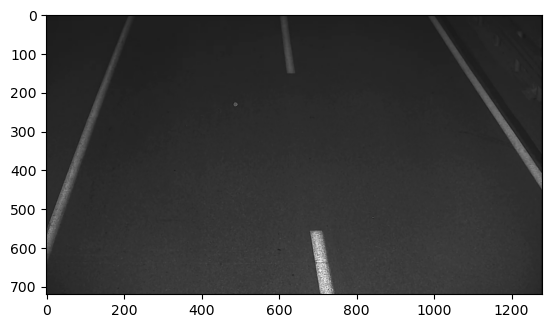

[]


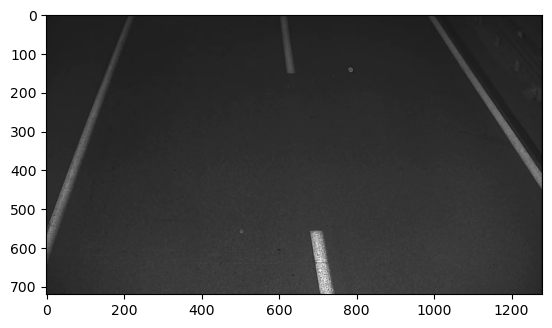

[]


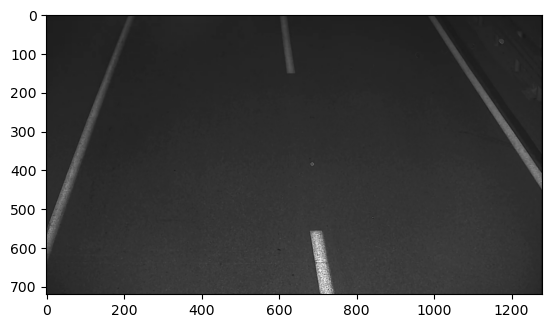

[]


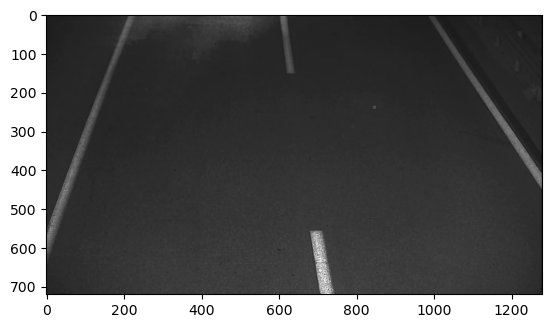

[]


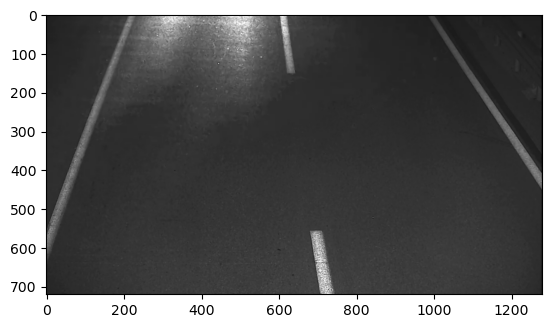

[]


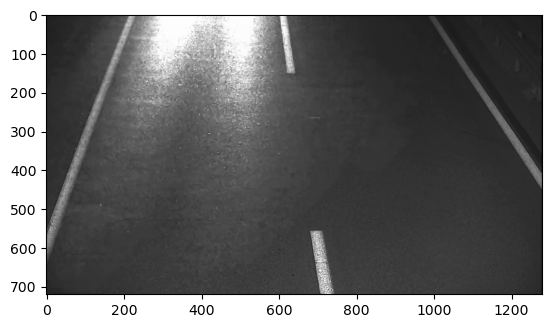

[]


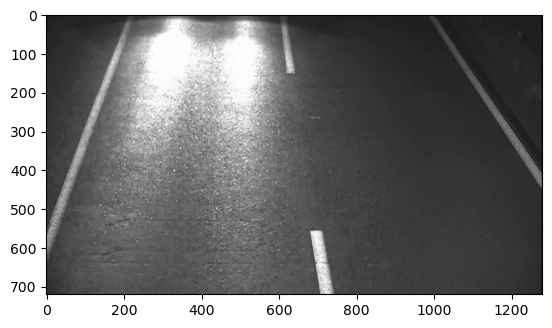

[]


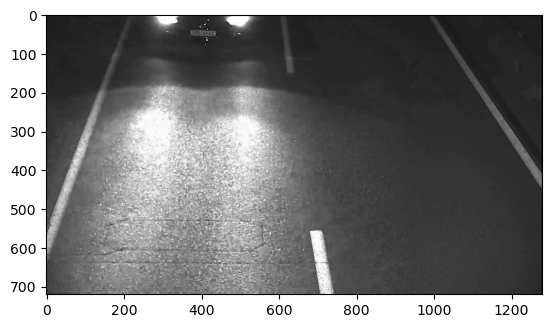

[]


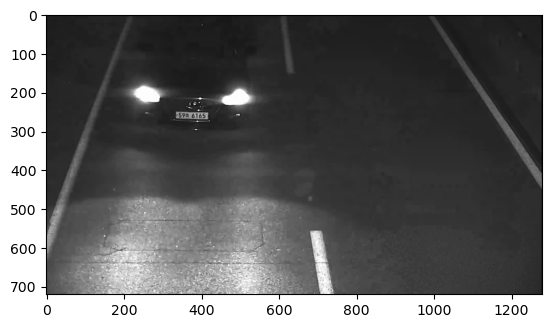

['590 61659']


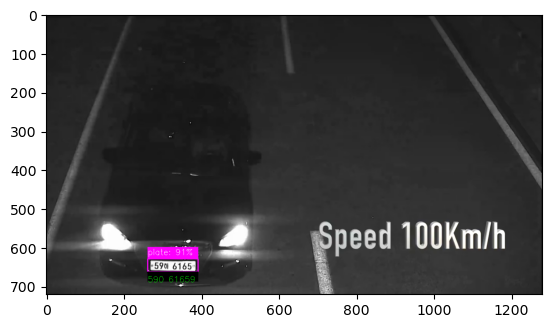

['590 61659']


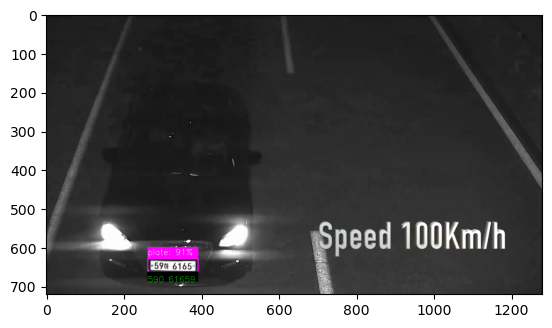

['590 61659']


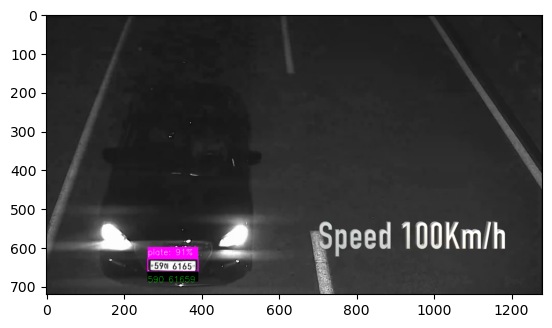

['590 61659']


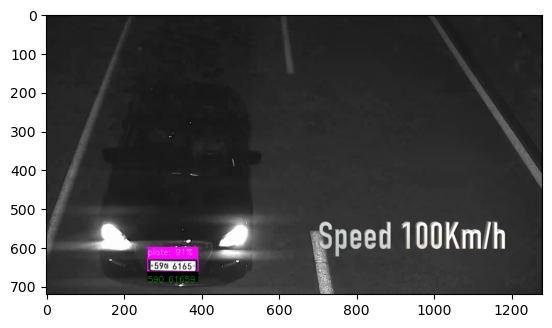

['590 61659']


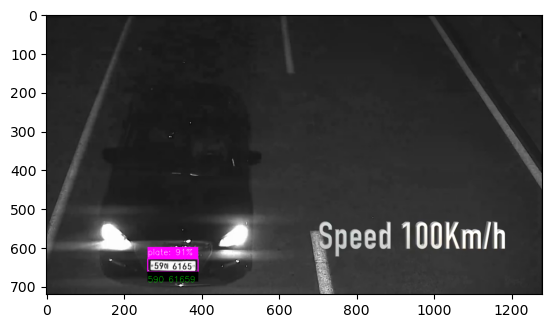

['590 61659']


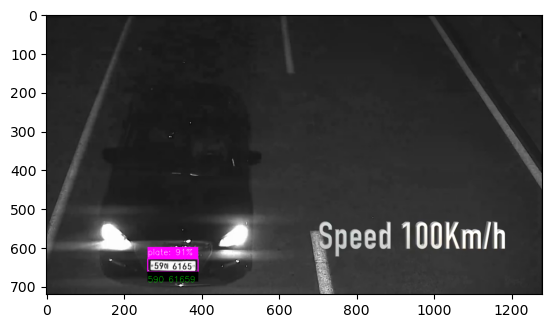

['590 61659']


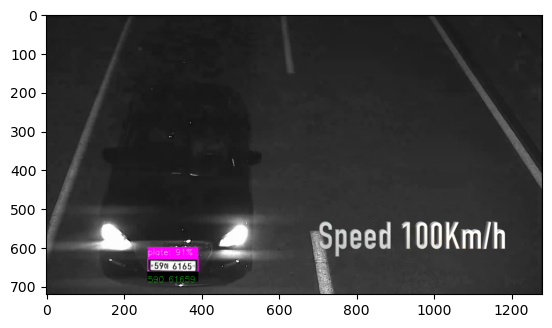

['590 61659']


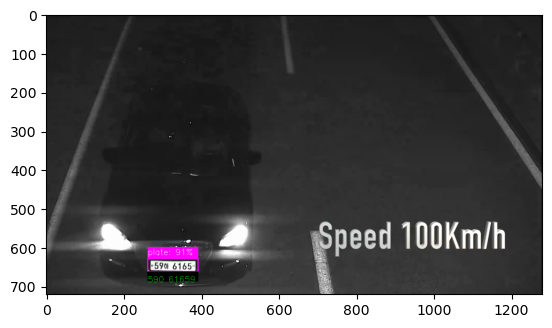

['590 61659']


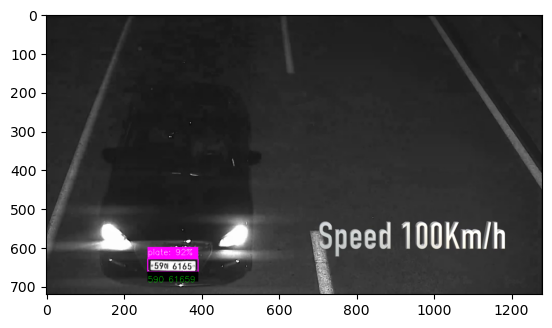

['590 61659']


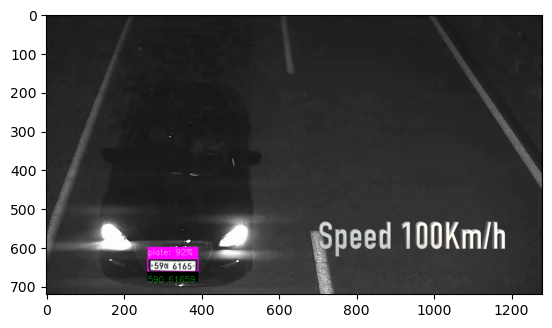

['590 61659']


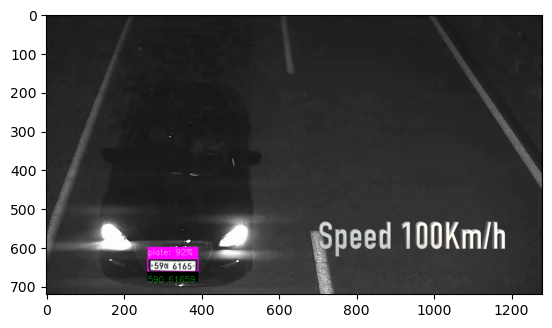

['590 61659']


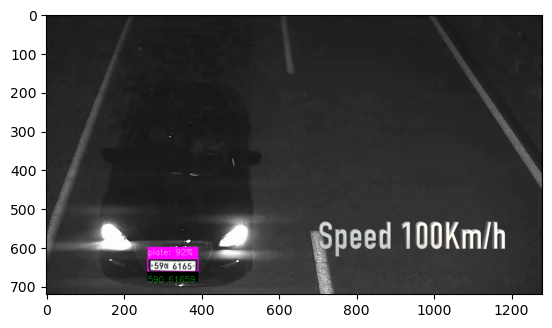

['590 61659']


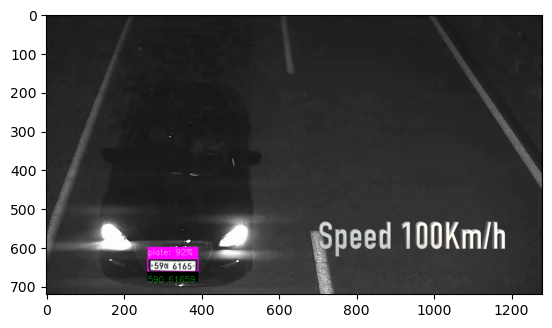

['590 61659']


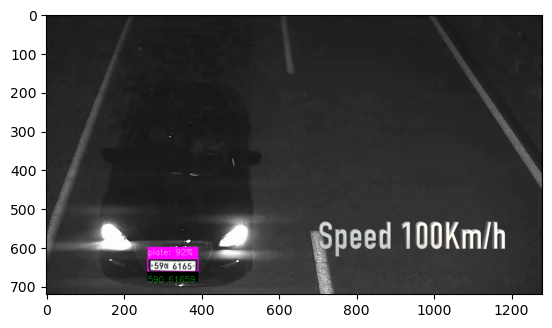

['590 61659']


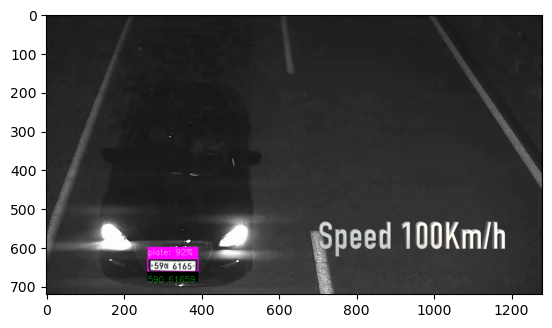

[]


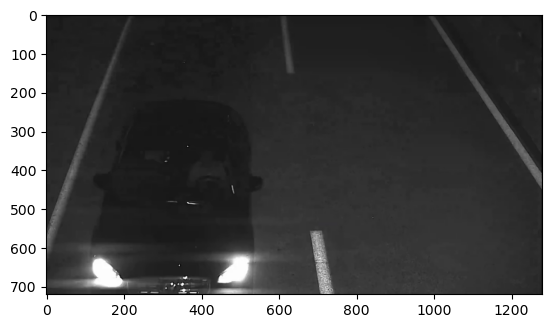

[]


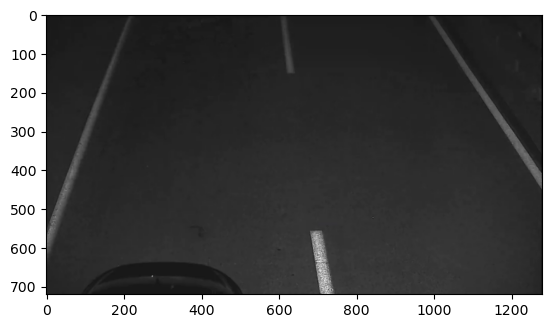

[]


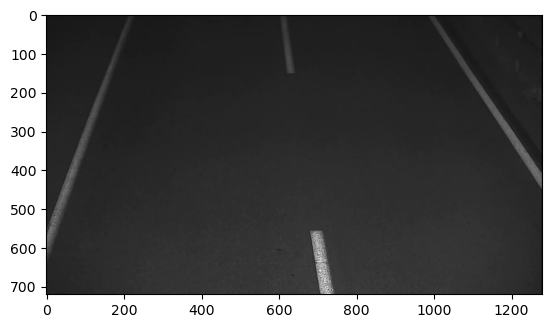

[]


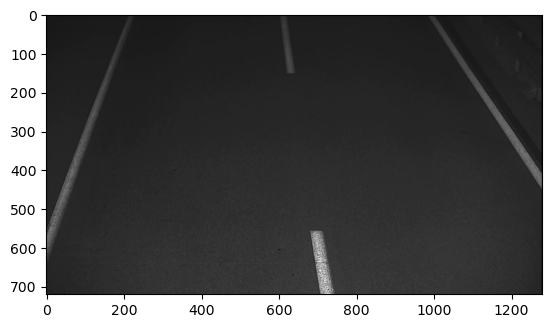

[]


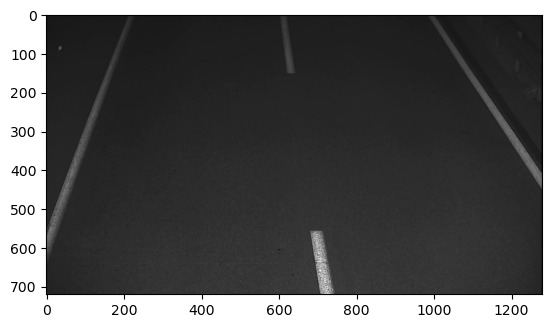

[]


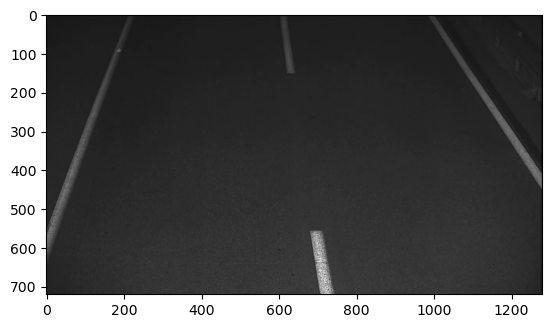

[]


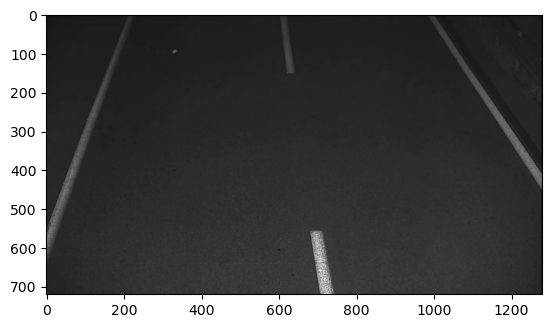

[]


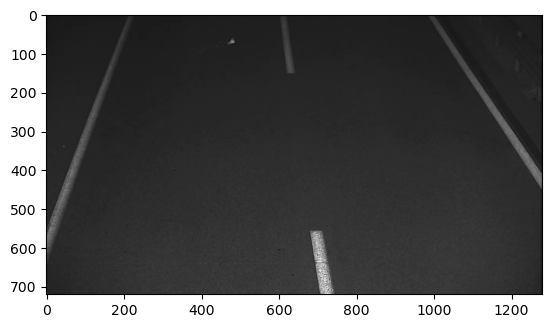

Unable to read video


error: OpenCV(4.5.4) /tmp/pip-req-build-jpmv6t9_/opencv/modules/highgui/src/window.cpp:1268: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvDestroyAllWindows'


In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

cap = cv2.VideoCapture('/kaggle/input/testing/anprTest.mp4')
text_results = []
while cap.isOpened():
    ret, frame = cap.read()

    if ret == False:
        print('Unable to read video')
        break
        
    for i in range(5):
            ret = cap.grab()

    results, texts = yolo_predictions(frame,net)
    text_results.append(texts)
    print(texts)
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.imshow(frame_rgb)
    plt.show()
#     if cv2.waitKey(30) == 27 :
#         break
#     if cv2.waitKey(1) == ord('q'):
#             break

cv2.destroyAllWindows()
cap.release()

